# Airline Passenger Satisfaction factors analysis

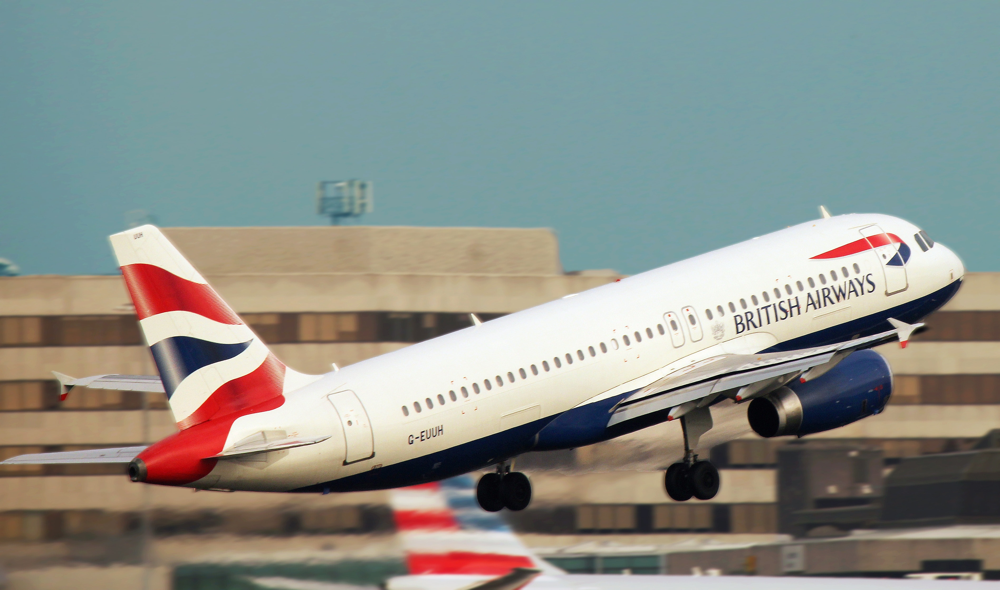

In [1]:
from PIL import Image
aeroplane=Image.open(r'C:\Users\LENOVO\Desktop\data analyst\New folder\pexels-pixabay-164589.jpg')
aeroplane

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import chart_studio.plotly as plty
import cufflinks as cf
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
from sklearn.preprocessing import StandardScaler

# Data Collection

In [3]:
airline_df=pd.read_csv(r"C:\Users\LENOVO\Desktop\data analyst\datasets\air passenger\air passengers.csv")

In [4]:
airline_df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [5]:
airline_df.shape

(103904, 25)

In [6]:
airline_df.tail(7)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
103897,103897,102203,Female,Loyal Customer,60,Business travel,Business,1599,5,5,...,4,4,4,4,4,4,4,9,7.0,satisfied
103898,103898,60666,Male,Loyal Customer,50,Personal Travel,Eco,1620,3,1,...,2,4,3,4,2,4,2,0,0.0,neutral or dissatisfied
103899,103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,...,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,...,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,...,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,...,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied
103903,103903,62567,Male,Loyal Customer,27,Business travel,Business,1723,1,3,...,1,1,1,4,4,3,1,0,0.0,neutral or dissatisfied


# Analysing and Cleaning Data

In [7]:
airline_df.columns

Index(['Unnamed: 0', 'id', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

In [8]:
airline_df.drop('Unnamed: 0',axis=1,inplace=True)

In [9]:
airline_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 103904 non-null  int64  
 1   Gender                             103904 non-null  object 
 2   Customer Type                      103904 non-null  object 
 3   Age                                103904 non-null  int64  
 4   Type of Travel                     103904 non-null  object 
 5   Class                              103904 non-null  object 
 6   Flight Distance                    103904 non-null  int64  
 7   Inflight wifi service              103904 non-null  int64  
 8   Departure/Arrival time convenient  103904 non-null  int64  
 9   Ease of Online booking             103904 non-null  int64  
 10  Gate location                      103904 non-null  int64  
 11  Food and drink                     1039

In [10]:
airline_df.describe()

,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,64924.210502,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,37463.812252,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.698682
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32533.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,64856.500000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,97368.250000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [11]:
airline_df.isna().sum()

id                                     0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             310
satisfaction                           0
dtype: int64

In [12]:
# Filling the missing values of 'Arrival Delay in Minutes' with mean value
Arrival_Delay_mean=airline_df['Arrival Delay in Minutes'].mean()
Arrival_Delay_mean

15.178678301832152

In [13]:
airline_df['Arrival Delay in Minutes'].fillna(value=Arrival_Delay_mean,inplace=True)

In [14]:
airline_df.isna().sum()

id                                   0
Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64

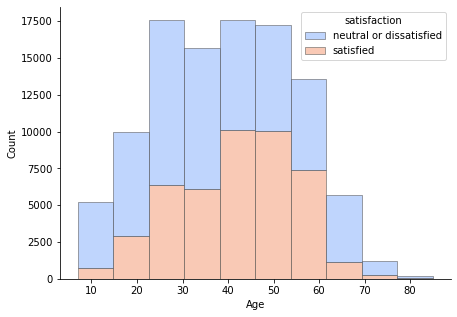

In [15]:
plt.figure(figsize=(7,5))
sns.histplot(x='Age',hue='satisfaction',multiple="stack",bins=10,palette='coolwarm',
              edgecolor=".3",
              linewidth=.5,data=airline_df)
sns.despine()
# Thus we can see that people in age group 25-55 are most dissatisfied
# No of flyers are more in range 25-60 years

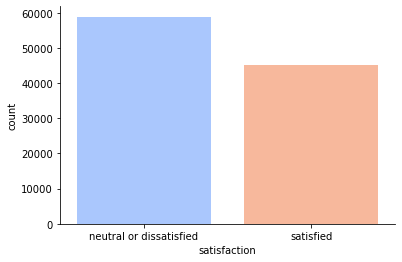

In [16]:
sns.countplot(x='satisfaction',palette='coolwarm',saturation=2.0,data=airline_df)
sns.despine()
# People flying are more dissatisfied than satisfied

In [17]:
airline_df['satisfaction'].value_counts()

neutral or dissatisfied    58879
satisfied                  45025
Name: satisfaction, dtype: int64

In [18]:
data=[58879,45025]
keys=['unsatisfied passengers','satisfied passengers']
palette_color = sns.color_palette('bright')

([<matplotlib.patches.Wedge at 0x1fc9ce9aaf0>,
 [Text(-0.22870506272227167, 1.0759618925804026, 'unsatisfied passengers'),
  Text(0.228705062722272, -1.0759618925804026, 'satisfied passengers')],
 [Text(-0.12474821603032998, 0.5868883050438559, '57%'),
  Text(0.12474821603033018, -0.5868883050438559, '43%')])

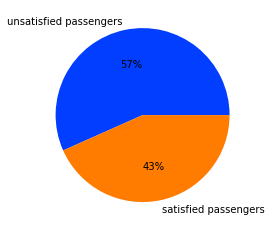

In [19]:
plt.pie(data,labels=keys,autopct='%.0f%%',colors=palette_color)

In [20]:
airline_df.columns

Index(['id', 'Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

In [21]:
airline_df['Cleanliness'].mean()
# Thus cleanliness on average is poor

3.2863508623344626

In [22]:
airline_df['Flight Distance'].mean()
# Average flight distance is 1189 km

1189.4483754234677

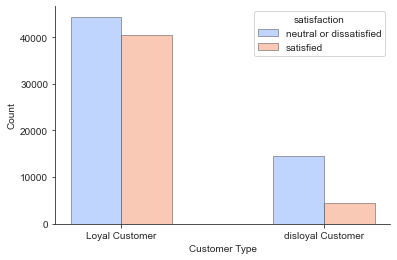

In [23]:
sns.set_style("ticks")
sns.histplot(x='Customer Type',hue='satisfaction',data=airline_df,bins=2,multiple="dodge",shrink=0.5
            ,palette='coolwarm',edgecolor=".3",
            linewidth=.5)
sns.despine()
# Thus disloyal customers are more dissatisfied 

In [24]:
airline_df['Gender'].value_counts()

Female    52727
Male      51177
Name: Gender, dtype: int64

<AxesSubplot:xlabel='Gender', ylabel='count'>

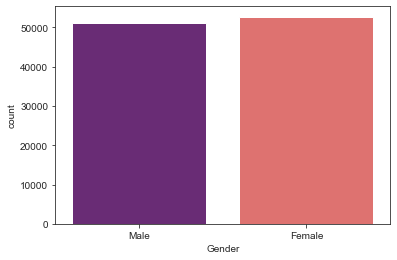

In [25]:
sns.countplot(x='Gender',data=airline_df,palette='magma')

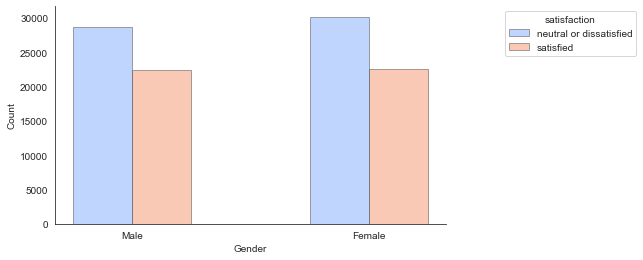

In [26]:
sns.set_style('white')
plt.figure(figsize=(7,4))
ax=sns.histplot(x="Gender",hue="satisfaction",data=airline_df,multiple="dodge",shrink=0.5,
            edgecolor=".3",
            palette='coolwarm',
            linewidth=.5)
sns.move_legend(ax,"upper right",bbox_to_anchor=(1.5, 1))
sns.despine()

In [27]:
airline_df.columns

Index(['id', 'Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

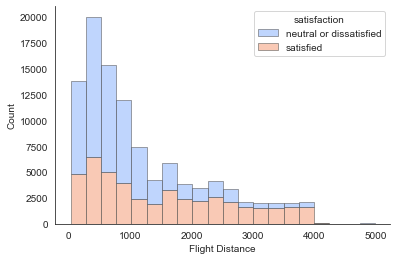

In [28]:
sns.histplot(x='Flight Distance',hue='satisfaction',data=airline_df,bins=20,multiple="stack",
             edgecolor=".3",
             palette='coolwarm',
             linewidth=.5)
sns.despine()
# shorter flights must be taken care of more

In [29]:
# Thus we can see that shorter duration flights have more dissatisfied customers

<AxesSubplot:xlabel='Cleanliness', ylabel='Count'>

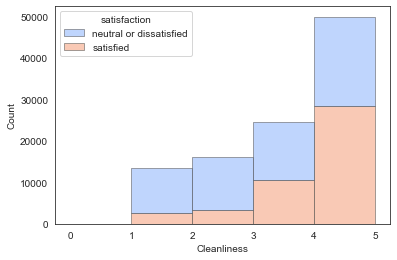

In [30]:
sns.histplot(x='Cleanliness',hue='satisfaction',data=airline_df,multiple="stack",bins=5,
             edgecolor=".3",
             palette='coolwarm',
             linewidth=.5)
# Thus flights must be clean to ensure satisfaction 
# 1 indicates cleanliness is low and 5 indicates good cleanliness in flight
# Thus we can see that as cleanliness increases satisfied passengers are more

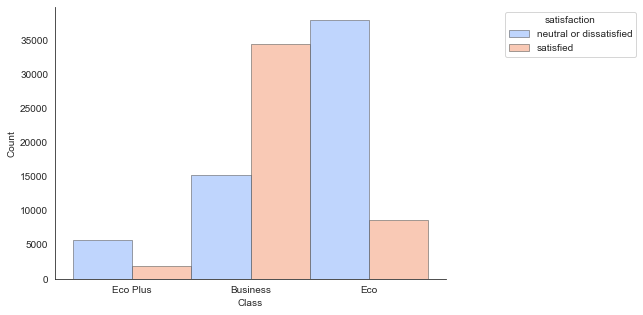

In [31]:
plt.figure(figsize=(7,5))
ax=sns.histplot(x='Class',hue='satisfaction',data=airline_df,multiple="dodge",
             edgecolor=".3",
            palette='coolwarm',
            linewidth=.5,bins=2)
sns.move_legend(ax,"upper right",bbox_to_anchor=(1.5,1))
sns.despine()
# Economy class passengers must be catered to more

In [32]:
# Thus Biz class passengers are most satisfied while Eco class passengers are least satisfied

In [33]:
airline_df['Type of Travel'].head()

0    Personal Travel
1    Business travel
2    Business travel
3    Business travel
4    Business travel
Name: Type of Travel, dtype: object

<AxesSubplot:xlabel='Type of Travel', ylabel='Count'>

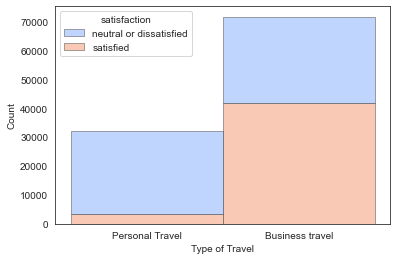

In [34]:
sns.histplot(x='Type of Travel',hue='satisfaction',data=airline_df,multiple="stack",
            palette='coolwarm'
            ,linewidth=.5,
            edgecolor=".3")
# People on personal travel needs more catering

In [35]:
airline_df['satisfaction'].iplot(kind="hist",bins=5,bargap=0)

# Training and Testing Data

In [36]:
# Conversion to numeric values  

airline_df['Type of Travel'].replace(regex={"Personal Travel":0,"Business travel":1},inplace=True)
airline_df['Class'].replace(regex={"Eco":1,"Eco Plus":2,"Business":3},inplace=True)
airline_df['Class'].replace(regex={"Eco":1,"Eco Plus":2,"Business":3},inplace=True)
airline_df['satisfaction'].replace(regex={"neutral or dissatisfied":0,"satisfied":1},inplace=True)
airline_df['Customer Type'].replace(regex={"disloyal Customer":0,"Loyal Customer":1},inplace=True)


hm=airline_df[['Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction']]

<AxesSubplot:>

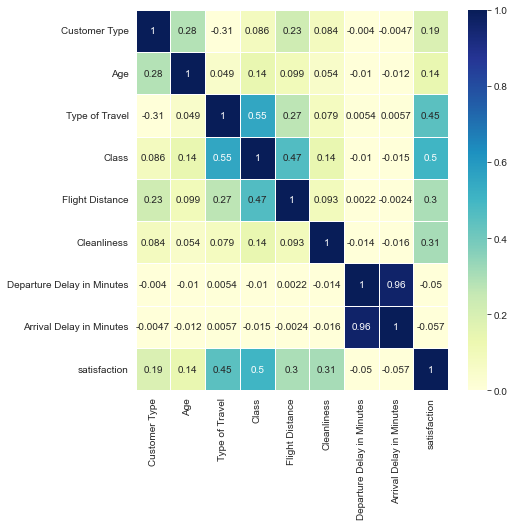

In [37]:
tc=hm.corr()
plt.subplots(figsize=(7,7))
sns.heatmap(tc,annot=True,cmap="YlGnBu",vmin=0,vmax=1,linewidths=0.7)

In [38]:
# Thus we can see the most important factors for satisfaction are
# Type of travel(R)
# Class(R)
# Cleanliness(R)
# Flight Distance(R)
# Customer Type(R)
# Age(R)

In [39]:
X=airline_df[['Type of Travel','Class','Cleanliness','Flight Distance','Customer Type','Age']]
y=airline_df['satisfaction']

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [41]:
 X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Applying Logistic Regression

In [42]:
logmodel=LogisticRegression(solver='lbfgs', max_iter=1000)

# scaler=StandardScaler()

In [43]:
logmodel.fit(X_train,y_train)  

LogisticRegression(max_iter=1000)

In [44]:
# X_train=scaler.fit_transform(X_train)
# X_test=scaler.transform(X_test)
# y_

In [45]:
predictions=logmodel.predict(X_test)
predictions

array([0, 1, 0, ..., 0, 1, 0], dtype=int64)

# Accuracy Check

In [46]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.84      0.85      0.84     17555
           1       0.80      0.78      0.79     13617

    accuracy                           0.82     31172
   macro avg       0.82      0.82      0.82     31172
weighted avg       0.82      0.82      0.82     31172



In [47]:
confusion_matrix(y_test,predictions)

array([[14946,  2609],
       [ 2948, 10669]], dtype=int64)

In [48]:
accuracy_score(y_test,predictions)*100
# Thus 82 percent accuracy

82.17310406775312